## Phase II: Data Curation, Exploratory Analysis, and Plotting

### Team：T4.15
### Names：Samuel Zheng，Trung Nguyen, Andres Matton-Conover, Fan Du
### DS3000

## Project Goal:
Finding good professors is key to a great college experience, especially at a big school like Northeastern. We’re exploring which colleges have the best-rated professors using Rate My Professor data to help students choose classes and show the university where teaching quality excels or needs work.

## Objectives:
  Our goal is to look at professor ratings in different colleges and departments at Northeastern University using data from the Rate My Professor website. By checking out the average ratings and how they’re spread out, we want to give students helpful information to make better choices when picking their classes. Plus, this analysis can give the university a clear picture of teaching quality across its colleges, showing where things are going well and where there might be room for improvement
  
## Research Question:
   Which colleges/departments in Northeastern University have the best-rated professors, and how does the distribution of average ratings vary across these departments?

## References:
  Articles
  Pérez-Rivero, C. A., de Obesso, M. de la M., & Núñez-Canal, M. (2022). Digital competence among university professors: analysis of the impact of the COVID crisis. Economic Research-Ekonomska Istraživanja, 36(3). https://doi.org/10.1080/1331677X.2022.2155859
  Murray D, Boothby C, Zhao H, Minik V, Bérubé N, Larivière V, Sugimoto CR. Exploring the personal and professional factors associated with student evaluations of tenure-track faculty. PLoS One. 2020 Jun 3;15(6):e0233515. doi: 10.1371/journal.pone.0233515. PMID: 32492028; PMCID: PMC7269236. https://pubmed.ncbi.nlm.nih.gov/32492028/

## Data Introduction:
The data are 3490 rows x 13 columns (i.e. 45370 individual cells)
Each row represents a specific professor at Northeastern University
The columns are as such: First Name, Middle Name, Last Name, ID, Department, Institution Name, Institution ID, Number of Ratings, Average Rating (Out of 5), Would Take Again (Percent), Level of Difficulty (Out of 5), Popular Tags, Reviews

## Data Collection:
### Data Source
  Website: https://www.ratemyprofessors.com/
  Data to be Scraped: Each individual Northeastern professor’s statistical and review data
### 3.	Data Scraping Process
  Libraries: Pandas, BeautifulSoup, Requests
  ratemyprof-api (Created by Nathaniel Louis Tisuela) used for finding professors tags and reviews
  1.	Use the API to collect Northeastern University professor names, tags, and some other miscellaneous information.
  2.	Filter the created data frame to just keep the professor names, tags, and department information. 
  3.	Remove two specific professors who don’t exist on the website
  4.	Use the tags to find the specific URL for each Northeastern professor.
  5.	On each URL, scrape necessary statistical data for the professor and call the API to get the reviews. 
  6.	Concatenate everything into one synthesized data frame.
## Data Cleaning and Organization 
  1. Remove the review column as there was only mashed-up information about comments and ratings which were already presented in the other
     columns.
  2. Remove rows that had no ratings for the columns: 'Average Rating (Out of 5)', 'Would Take Again (Percent)',
     'Level of Difficulty (Out of 5)'

## Visualization

  
















In [5]:
import pandas as pd

df = pd.read_csv('neu_rmp_updated.csv')
columns_to_check = ['Average Rating (Out of 5)', 'Would Take Again (Percent)', 'Level of Difficulty (Out of 5)']  
df = df.dropna(subset=columns_to_check)
df.head(40)

,First Name,Middle Name,Last Name,ID,Department,Institution Name,NEU_Colleges,Institution ID,Number of Ratings,Average Rating (Out of 5),Would Take Again (Percent),Level of Difficulty (Out of 5),Popular Tags,Reviews
0,Anand,NaN,Asthagiri,2894891,Biomedical,Northeastern University,College of Science (COS),696,1.0,5.0,1.00,3.0,"['Amazing lectures', 'Inspirational', 'Accessi...",Attendance Clarity (color) Easy (color) ...
2,Faizul,NaN,Huq,2854044,Business,Northeastern University,D’Amore-McKim School of Business (DMSB),696,7.0,2.6,0.43,4.0,"['Tough grader', 'Participation matters', 'Gro...",Attendance Clarity (color) Easy (color) ...
5,sakib,NaN,miazi,2989886,Computer Science,Northeastern University,Khoury College of Computer Sciences,696,1.0,1.0,0.00,4.0,"['Group projects', 'Lots of homework', 'Lectur...",Attendance Clarity (color) Easy (color) ...
7,Mohammad,NaN,Abderrazzaq,1268571,Arabic,Northeastern University,College of Social Sciences and Humanities (CSSH),696,20.0,4.5,1.00,2.7,"['Respected', 'Caring', 'Amazing lectures', 'W...",Attendance Clarity (color) Easy (color) Hel...
8,Mehdi,NaN,Abedi,2162443,Engineering,Northeastern University,College of Engineering (COE),696,21.0,3.5,0.62,3.9,"['Get ready to read', 'Hilarious', 'Lots of ho...",Attendance Clarity (color) Easy (color)...
9,Joshua,NaN,Abel,2957067,Economics,Northeastern University,College of Social Sciences and Humanities (CSSH),696,7.0,5.0,1.00,3.4,"['Amazing lectures', 'Gives good feedback', 'A...",Attendance Clarity (color) Easy (color) ...
10,Margot,NaN,Abels,2529082,Women's Studies,Northeastern University,College of Social Sciences and Humanities (CSSH),696,12.0,4.0,0.75,2.8,"['Participation matters', 'Get ready to read',...",Attendance Clarity (color) Easy (color)...
12,Sahar,NaN,Abi Hassan Abdul Samad,3000323,Political Science,Northeastern University,College of Social Sciences and Humanities (CSSH),696,1.0,5.0,1.00,4.0,"['Tough grader', 'Get ready to read', 'So many...",Attendance Clarity (color) Easy (color) ...
13,Emad,NaN,Aboelela,2546624,Electrical Engineering,Northeastern University,College of Engineering (COE),696,10.0,4.0,0.80,2.5,"['Participation matters', 'EXTRA CREDIT', 'Cle...",Attendance Clarity (color) Easy (color) Help...
14,Paul,NaN,Abourjaily,2654899,Nursing,Northeastern University,Bouvé College of Health Sciences,696,1.0,5.0,1.00,3.0,"['Amazing lectures', 'Clear grading criteria',...",Attendance Clarity (color) Easy (color) Help...


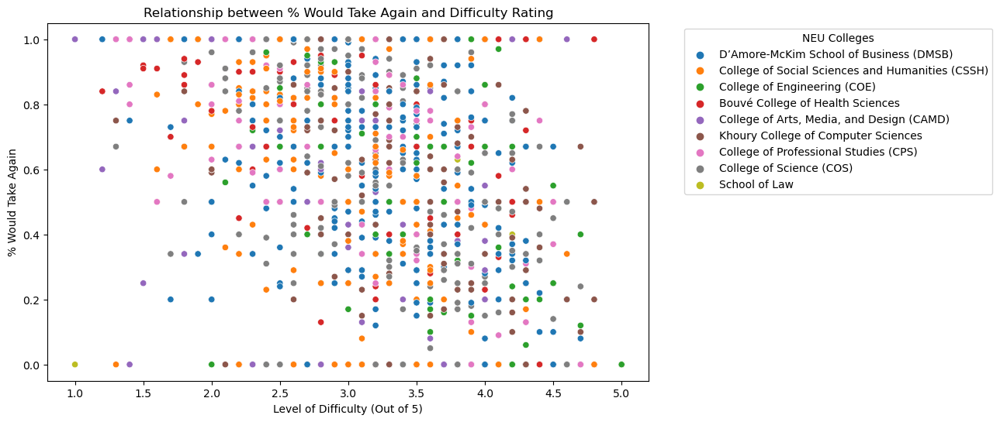

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
filtered_df = df[df['Number of Ratings'] >= 4]
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Level of Difficulty (Out of 5)', 
                y='Would Take Again (Percent)', 
                hue='NEU_Colleges', 
                data=filtered_df, 
                palette='tab10')

plt.title('Relationship between % Would Take Again and Difficulty Rating')
plt.xlabel('Level of Difficulty (Out of 5)')
plt.ylabel('% Would Take Again')
plt.legend(title='NEU Colleges', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [11]:
rating_plot = alt.Chart(df).mark_circle(size=100).encode(
    x=alt.X('Average Rating (Out of 5):Q', title='Average Rating'),
    y=alt.Y('Number of Ratings:Q', title='Number of Ratings'),
    color=alt.condition(
        alt.datum['Average Rating (Out of 5)'] >= 4.5,  
        alt.value('green'), 
        alt.value('red') 
    ),
    tooltip=['First Name', 'Last Name','Department', 'Average Rating (Out of 5)', 'Number of Ratings']
).properties(
    title='The Distribution between Number of Ratings and Average Rating',
    width=600,
    height=400
).interactive()

rating_plot

alt.Chart(...)

In [9]:
import altair as alt

sorted_data = df.sort_values(by='Number of Ratings', ascending=False)
bar_chart = alt.Chart(sorted_data.head(10)).mark_bar().encode(
    x=alt.X('Number of Ratings:Q'),
    y=alt.Y('Last Name:N', sort='-x'),
    color=alt.Color('Average Rating (Out of 5):Q'),
    tooltip=['First Name', 'Last Name', 'Department', 'Number of Ratings', 'Average Rating (Out of 5)']  
).properties(
    title='Top 10 Professors with the Most Ratings',
    width=600,
    height=400
)

bar_chart

alt.Chart(...)